262144


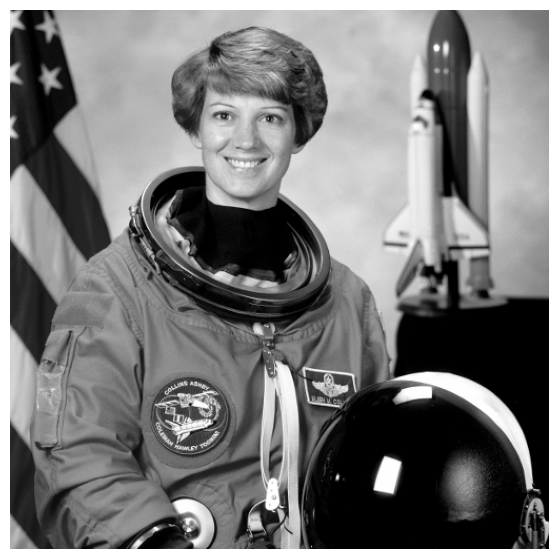

In [1]:
import skimage as si
import skimage.color as sc
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as ss
from scipy.sparse.linalg import LinearOperator, eigsh
import scipy.optimize as so
from algorithms import Algorithms
import time
import pywt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim


img = sc.rgb2gray( si.data.astronaut() )

print( np.prod( img.shape ) )

plt.figure( figsize = ( 7, 7 ) )
plt.imshow( img, cmap = plt.cm.gray )
plt.axis( "off" )
plt.show()

In [2]:
N_kernel = 7
kernel = np.full( ( N_kernel, N_kernel ), 1 / ( N_kernel ** 2 ) )

def A( x ):
    return ss.convolve2d( x, kernel, mode = "same" )

def A_transpose( x ):
    return ss.correlate2d( x, kernel, mode = "same" )

def ATA( x ):
    return A_transpose( A( x ) )

In [3]:
#testando se AT é adjunta de A ( y'Ax = x'ATy )

x = np.random.standard_normal( size = img.shape )
y = np.random.standard_normal( size = img.shape )

print( ( y * A( x ) ).sum() )
print( ( x * A_transpose( y ) ).sum() )

#okay

0.9788083613474621
0.9788083613474692


In [4]:
img_borrada = A( img )


In [5]:
#vendo se L é adjunta de LT (y'Lx = x'LTy)

def L( p, q ):

        P = np.pad(p, ( ( 1, 1 ), ( 0, 0 ) ), mode = 'constant', constant_values = 0 )
        Q = np.pad(q, ( ( 0, 0 ), ( 1, 1 ) ), mode = 'constant', constant_values = 0 )
        
        return ( P[ 1:, : ] + Q[ :, 1:  ] - P[ :-1, : ] - Q[ :, :-1 ] )

def LT( b ):
    p = b[ :-1, : ] - b[ 1:, : ]
    q = b[ :, :-1 ] - b[ :, 1: ]

    return p, q

N, M = 10, 10

p = np.random.randn( N - 1, M )
q = np.random.randn( N, M - 1 )
y = np.random.randn( N, M )

L_pq = L( p, q )
p_adj, q_adj = LT( y )

print( np.sum( L_pq * y ) )

print( np.sum( p * p_adj ) + np.sum( q * q_adj ) )

5.824180425753427
5.824180425753432


In [6]:
#imagem borrada com ruído

rng = np.random.default_rng( seed = 42 )

gauss_noise = rng.normal( 0, 0.01, img.shape )
b = img_borrada + gauss_noise

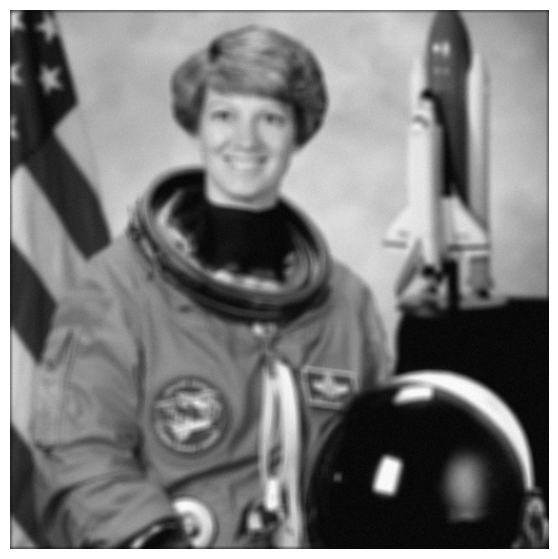

In [7]:
plt.figure( figsize = ( 7, 7 ) )
plt.imshow( b, cmap = plt.cm.gray )
plt.axis( "off" )
plt.show()

In [8]:
rows, cols = img_borrada.shape[ 0 ], img_borrada.shape[ 1 ]
dim = rows * cols

def mv( v ):
    x_2d = v.reshape( ( rows, cols ) )
    res_2d = ATA( x_2d )
    return res_2d.reshape( -1 )

operator = LinearOperator( ( dim, dim ), matvec = mv )

eigenvals, _ = eigsh( operator, k = 1, which = 'LM' )

norma_espectral = eigenvals[ 0 ]
print( f"Norma Espectral de A'A: {norma_espectral}" )
print( f'O tamanho de passo máximo para que o algoritmo seja garantido a convergir é de { 1 / norma_espectral }' )

Norma Espectral de A'A: 0.9997013347066693
O tamanho de passo máximo para que o algoritmo seja garantido a convergir é de 1.0002987545209372


In [8]:
def f( x ):
    return 1/2 * ( (A( x ) - b) ** 2 ).sum()

def grad_f( x ):
    return A_transpose( A( x ) - b )

def g( x, **kwargs ):
    diff_i = x[ :-1, :-1 ] - x[ 1:, :-1 ]
    diff_j = x[ :-1, :-1 ] - x[ :-1, 1: ]

    res_i = x[ :-1, -1 ] - x[ 1:, -1 ]
    res_j = x[ -1, :-1 ] - x[ -1, 1: ]

    return np.sum( np.sqrt( diff_i ** 2 + diff_j ** 2 ) ) + np.sum( np.abs( res_i ) ) + np.sum( np.abs( res_j ) )


In [16]:
# #usando o critério de quase-otimização ( qoc ) que encontrei no paper: Comparing parameter choice methods for regularization
# #of ill-posed problems Frank Bauer a , Mark A. Lukas b

# gammas = [ 0.001, 0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5 ] #os valores tem que estar ordenados
# step = 1
# x0 = np.zeros_like( b )
# prox = Algorithms.prox_tv
# tol = 1.0e-10
# max_iter = 100 

# kwargs = {'max_iter_tv' : 10, 'L' : L, 'LT' : LT, 'proj_P' : Algorithms.proj_P}

# iters_gammas = []
# for gamma in gammas:
#     iters = Algorithms.fista_fixo( f = f, grad_f = grad_f, prox = prox, x0 = x0, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
#     iters_gammas.append( iters )

# best_x_gamma = []
# for iters in iters_gammas:
#     best_x_gamma.append( iters[ -1 ] )

# diffs_gamma = [ np.linalg.norm( best_x_gamma[ j ] - best_x_gamma[ j+1 ]) for j in range( len( best_x_gamma ) - 1 ) ]
# j_star = np.argmin( diffs_gamma )
# gamma_star = gammas[ j_star ]

# print( "Gamma ótimo:", gamma_star )


Gamma ótimo: 0.001
Menor erro absoluto atingido: 17.439242201659


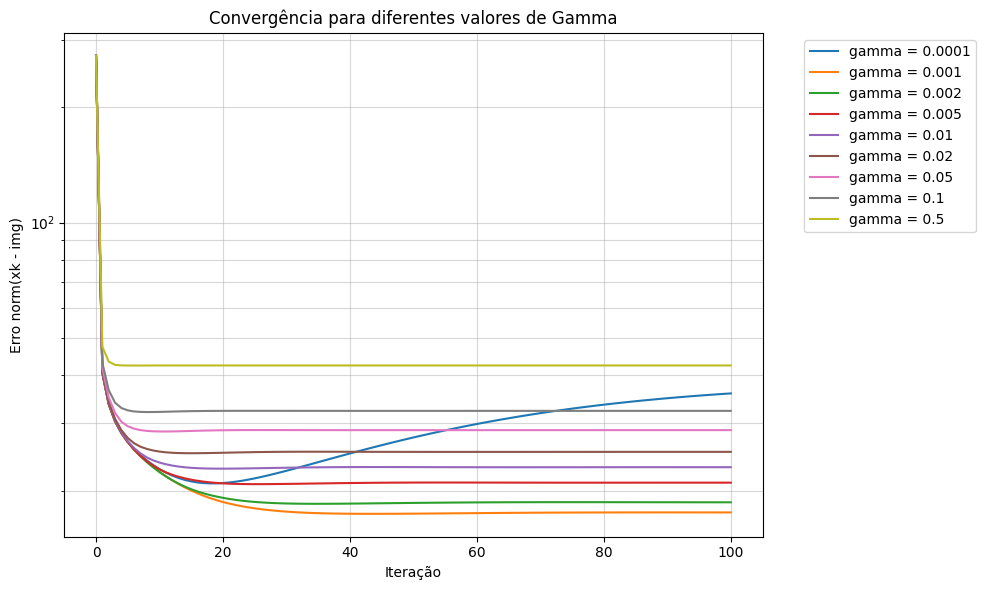

In [10]:
gammas = [ 0.0001, 0.001, 0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.5 ]
step = 1
x0 = np.zeros_like( b )
prox = Algorithms.prox_tv
tol = 1.0e-10
max_iter = 100 
kwargs = {'max_iter_tv' : 15, 'L' : L, 'LT' : LT, 'proj_P' : Algorithms.proj_P}

min_errors = []
error_histories = {} 

for gamma in gammas:
    iters = Algorithms.fista_fixo( f = f, grad_f = grad_f, prox = prox, x0 = x0, step = step, 
                                   gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
    
    errors_k = [ np.linalg.norm( xk - img ) for xk in iters ]
    
    error_histories[ gamma ] = errors_k 
    min_errors.append( min( errors_k ) )

idx_best = np.argmin( min_errors )
gamma_star = gammas[ idx_best ]

print( f"Gamma ótimo: {gamma_star}" )
print( f"Menor erro absoluto atingido: {min_errors[ idx_best ]}" )

plt.figure( figsize = ( 10, 6 ) )

for gamma in gammas:
    plt.plot( error_histories[ gamma ], label = f"gamma = {gamma}" )

plt.yscale( 'log' )
plt.xlabel( 'Iteração' )
plt.ylabel( 'Erro norm(xk - img)' )
plt.title( 'Convergência para diferentes valores de Gamma' )
plt.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )
plt.grid( True, which = "both", ls = "-", alpha = 0.5 )
plt.tight_layout()

plt.show()

In [9]:
def compare_methods( methods, f, g, grad_f, prox, x0, gamma, img, max_iter = 1000, tol = 1e-2, **kwargs ):
    results = {}
    for name, method in methods.items():

        start_time = time.perf_counter()
        iters = method( f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs )
        end_time = time.perf_counter()

        exec_time = end_time - start_time
        err_vals = [ np.sqrt( np.sum( ( img - x ) ** 2 ) ) / np.sqrt( np.sum( img ** 2 ) ) for x in iters ]
        F_vals = [ f( x ) + gamma * g( x, **kwargs ) for x in iters ]

        results[ name ] = {
            "iterations": len( iters ),
            "execution_time": exec_time,
            "errors": err_vals,
            "F_values": F_vals,
            "final_image": iters[ -1 ]
        }

    F_star = min( min( vals[ "F_values" ] ) for vals in results.values() )
    return results, F_star

def delta_F( F_vals ):
    return [ abs( F_vals[ k ] - F_vals[ k-1 ] ) for k in range( 1, len( F_vals ) ) ]

def get_metrics( img_true, img_test ):
    p = psnr( img_true, img_test, data_range = img_true.max() - img_true.min() )
    s = ssim( img_test, img_true, data_range=img_true.max() - img_true.min(), channel_axis = None )
    return p, s


# Testando para o $\gamma = 0.001$ ótimo

In [12]:
step = 1
gamma = gamma_star
x0 = np.zeros_like( b )

In [15]:
methods = {
    "ISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_fixo( f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Backtracking": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_backtracking(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, beta = 0.95, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
}

params_tv = {'max_iter_tv' : 15, 
              'L' : L, 
              'LT' : LT, 
              'proj_P' : Algorithms.proj_P,
              'Q' : ATA}

results, F_star = compare_methods( methods, f, g, grad_f, Algorithms.prox_tv, x0, gamma, img, max_iter = 250, tol = 1e-2, **params_tv )
#mesmo com a A sendo adjunta a AT, H adjunta a HT e HT sendo a inversa de H, o fista utilizando o passo exato não converge


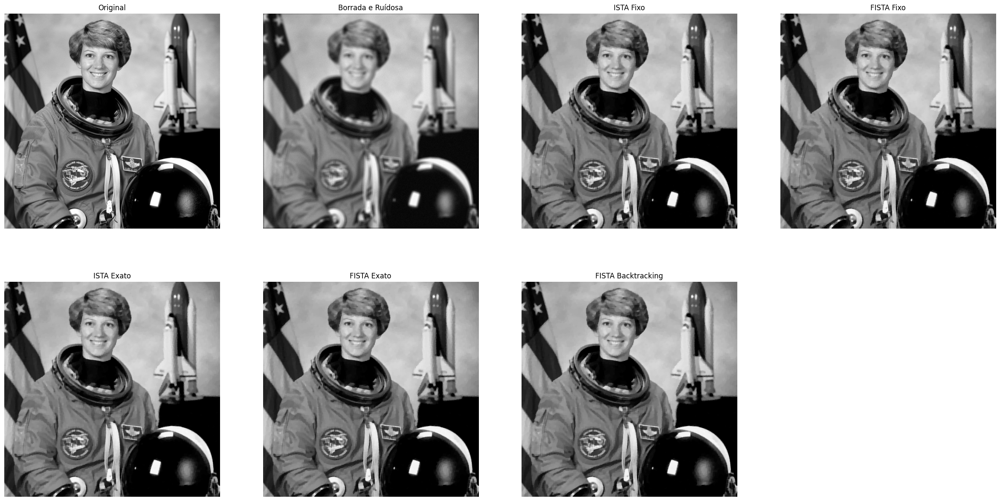

In [16]:
plt.figure( figsize = ( 30, 15 ) )

names = [ "ISTA Fixo", "FISTA Fixo", "ISTA Exato", "FISTA Exato", "FISTA Backtracking" ]

plt.subplot( 2, 4, 1 )
plt.imshow( img, cmap = plt.cm.gray )
plt.axis( "off" )
plt.title( "Original" )

plt.subplot( 2, 4, 2 )
plt.imshow( b, cmap = plt.cm.gray )
plt.axis( "off" )
plt.title( "Borrada e Ruídosa" )

for i, name in enumerate( names, start = 3 ):
    plt.subplot( 2, 4, i )
    plt.imshow( results[ name ][ "final_image" ], cmap = plt.cm.gray )
    plt.axis( "off" )
    plt.title( name )

plt.show()


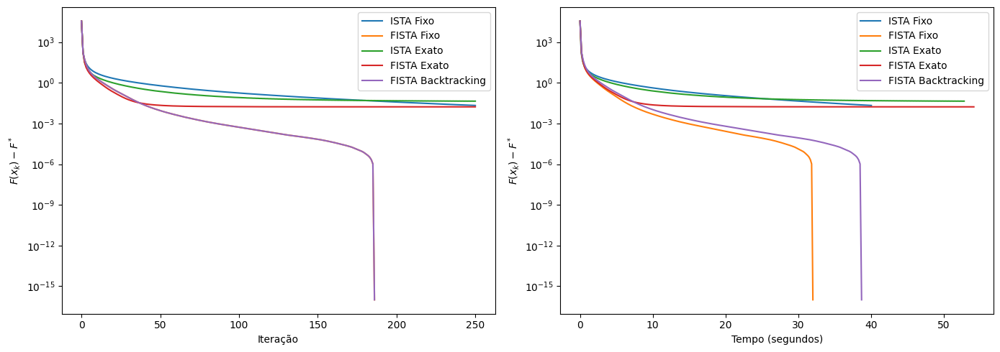

In [17]:
epsilon = 1e-16

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "F_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()


plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "F_values" ] )
    diff_vals = vals - F_star + epsilon
    total_time = results[ name ][ "execution_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()


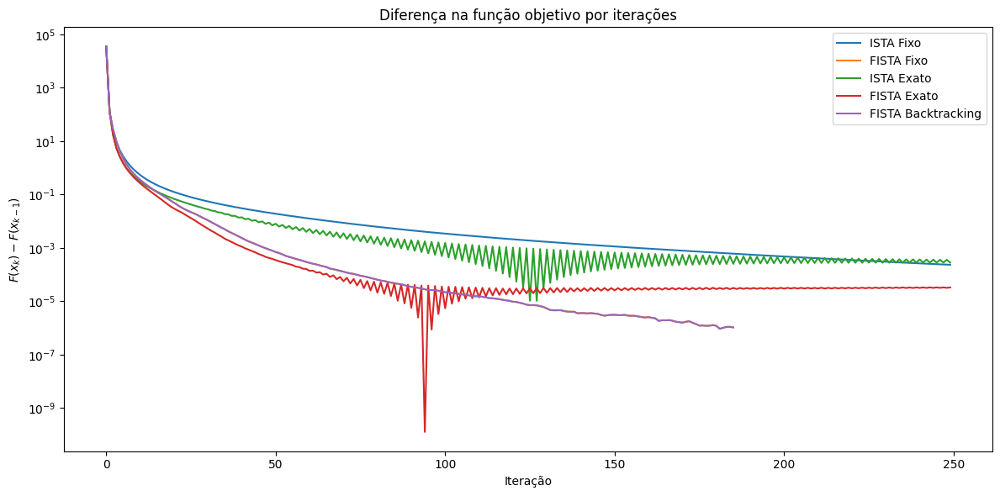

In [18]:
def delta_F( F_vals ):
    return [ abs( F_vals[ k ] - F_vals[ k-1 ] ) for k in range( 1, len( F_vals ) ) ]

plt.figure( figsize = ( 12, 6 ) )
for name in names:
    deltas = delta_F( results[ name ][ "F_values" ] )
    plt.semilogy( deltas, label = name )

plt.legend()
plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F(x_{k-1})$" )
plt.title("Diferença na função objetivo por iterações")
plt.tight_layout()
plt.show()

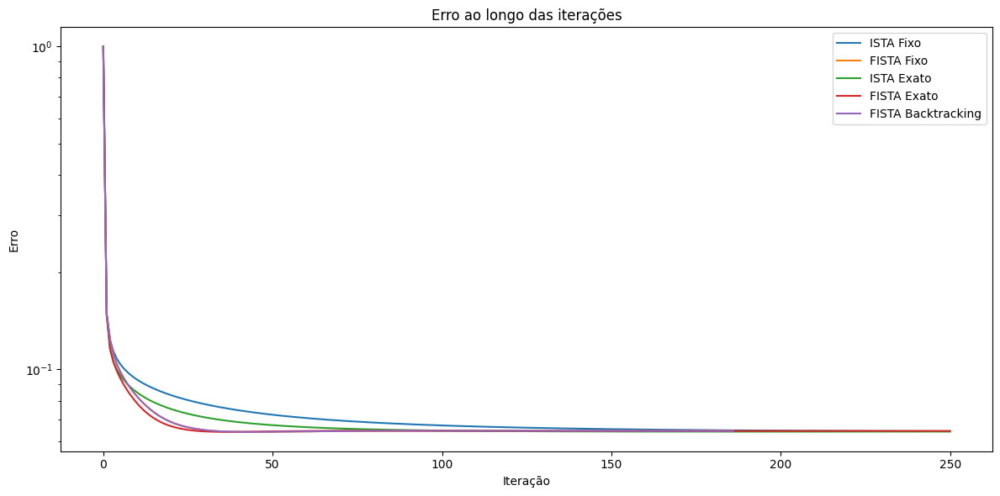

In [19]:
plt.figure( figsize = ( 12, 6 ) )

for name in names:
    vals = results[ name ][ "errors" ]
    plt.semilogy( vals, label = name )

plt.legend()
plt.xlabel( "Iteração" )
plt.ylabel( "Erro" )
plt.title( "Erro ao longo das iterações" )
plt.tight_layout()
plt.show()


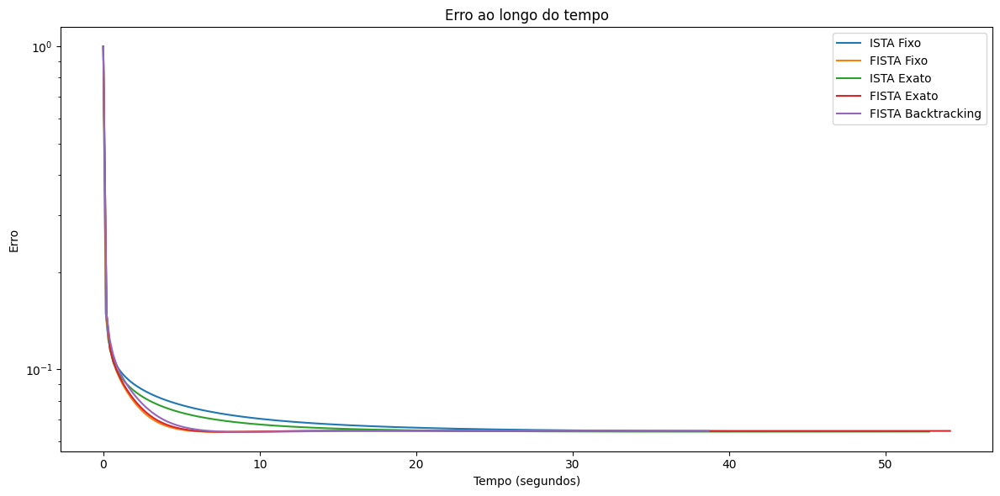

In [20]:
plt.figure( figsize = ( 12, 6 ) )

for name in names:
    vals = np.array( results[ name ][ "errors" ] )
    total_time = results[ name ][ "execution_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    plt.semilogy( times, vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "Erro" )
plt.legend()
plt.title( "Erro ao longo do tempo" )
plt.tight_layout()
plt.show()


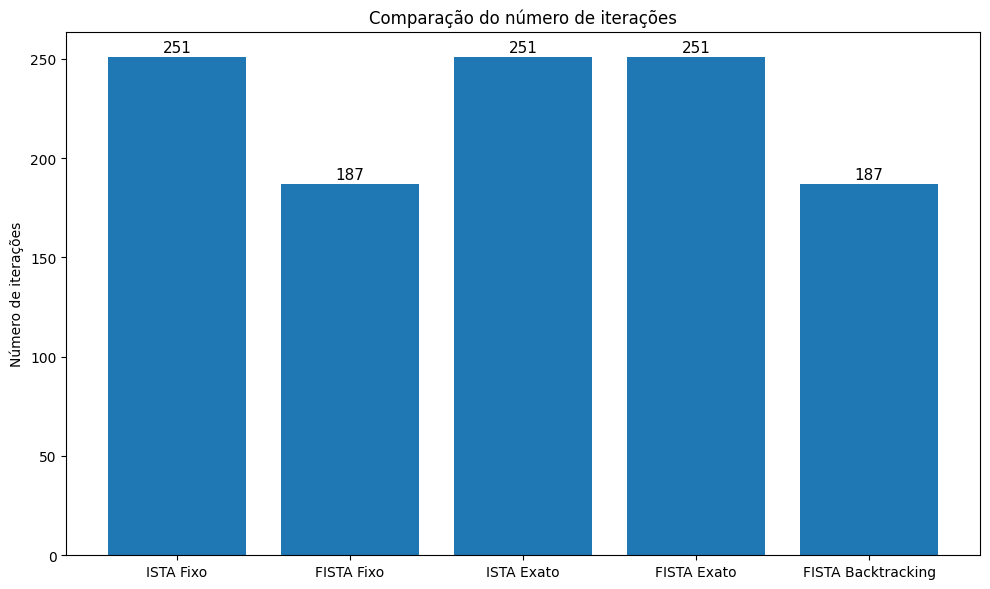

In [21]:
num_iters = [ results[ name ][ "iterations" ] for name in names ]

plt.figure( figsize = ( 10, 6 ) )
bars = plt.bar( names, num_iters )
plt.ylabel( "Número de iterações" )
plt.title( "Comparação do número de iterações" )

for bar in bars:
    height = bar.get_height()
    plt.text( bar.get_x() + bar.get_width() / 2, height + 1, str( height ), ha = 'center', va = 'bottom', fontsize = 11 )
plt.tight_layout()
plt.show()


# Testando com mais iterações e um erro menor

In [22]:
step = 1
gamma = 0.001
x0 = np.zeros_like( b )


In [23]:
methods = {
    "ISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_fixo( f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Backtracking": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_backtracking(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, beta = 0.95, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
}

params_tv = {'max_iter_tv' : 15, 
              'L' : L, 
              'LT' : LT, 
              'proj_P' : Algorithms.proj_P,
              'Q' : ATA}

results, F_star = compare_methods( methods, f, g, grad_f, Algorithms.prox_tv, x0, gamma, img, max_iter = 500, tol = 1e-3, **params_tv )

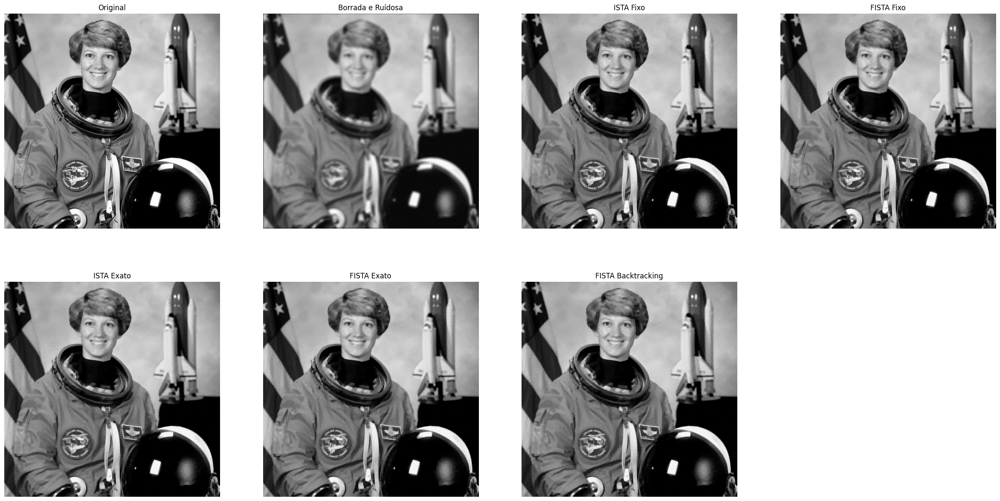

In [24]:
plt.figure( figsize = ( 30, 15 ) )

names = [ "ISTA Fixo", "FISTA Fixo", "ISTA Exato", "FISTA Exato", "FISTA Backtracking" ]

plt.subplot( 2, 4, 1 )
plt.imshow( img, cmap = plt.cm.gray )
plt.axis( "off" )
plt.title( "Original" )

plt.subplot( 2, 4, 2 )
plt.imshow( b, cmap = plt.cm.gray )
plt.axis( "off" )
plt.title( "Borrada e Ruídosa" )

for i, name in enumerate( names, start = 3 ):
    plt.subplot( 2, 4, i )
    plt.imshow( results[ name ][ "final_image" ], cmap = plt.cm.gray )
    plt.axis( "off" )
    plt.title( name )

plt.show()


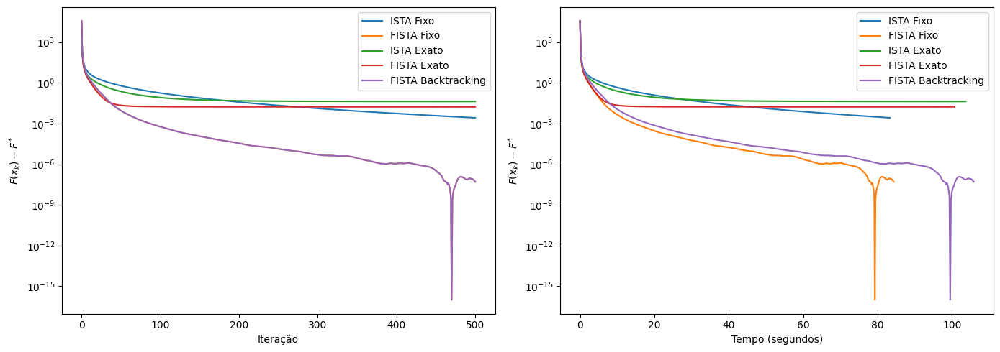

In [25]:
epsilon = 1e-16

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "F_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()


plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "F_values" ] )
    diff_vals = vals - F_star + epsilon
    total_time = results[ name ][ "execution_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()


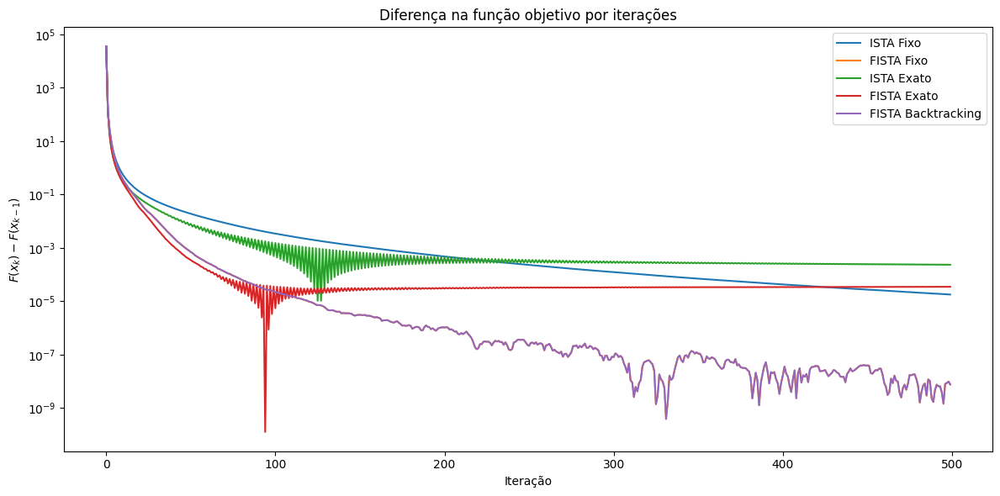

In [26]:
def delta_F( F_vals ):
    return [ abs( F_vals[ k ] - F_vals[ k-1 ] ) for k in range( 1, len( F_vals ) ) ]

plt.figure( figsize = ( 12, 6 ) )
for name in names:
    deltas = delta_F( results[ name ][ "F_values" ] )
    plt.semilogy( deltas, label = name )

plt.legend()
plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F(x_{k-1})$" )
plt.title("Diferença na função objetivo por iterações")
plt.tight_layout()
plt.show()

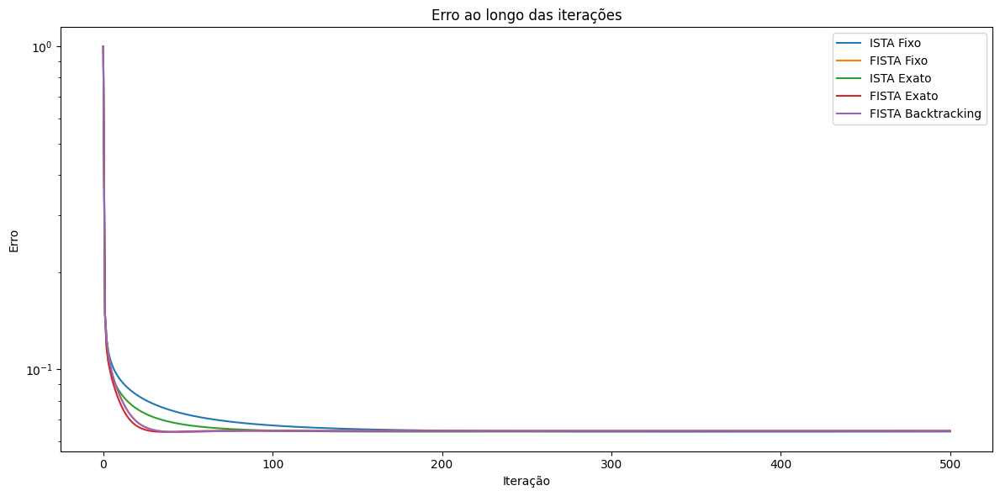

In [27]:
plt.figure( figsize = ( 12, 6 ) )

for name in names:
    vals = results[ name ][ "errors" ]
    plt.semilogy( vals, label = name )

plt.legend()
plt.xlabel( "Iteração" )
plt.ylabel( "Erro" )
plt.title( "Erro ao longo das iterações" )
plt.tight_layout()
plt.show()


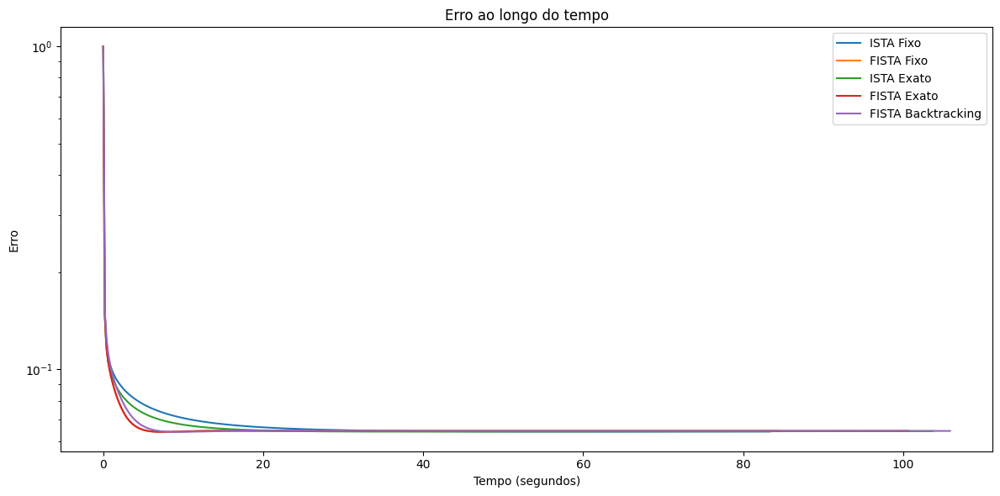

In [28]:
plt.figure( figsize = ( 12, 6 ) )

for name in names:
    vals = np.array( results[ name ][ "errors" ] )
    total_time = results[ name ][ "execution_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    plt.semilogy( times, vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "Erro" )
plt.legend()
plt.title( "Erro ao longo do tempo" )
plt.tight_layout()
plt.show()


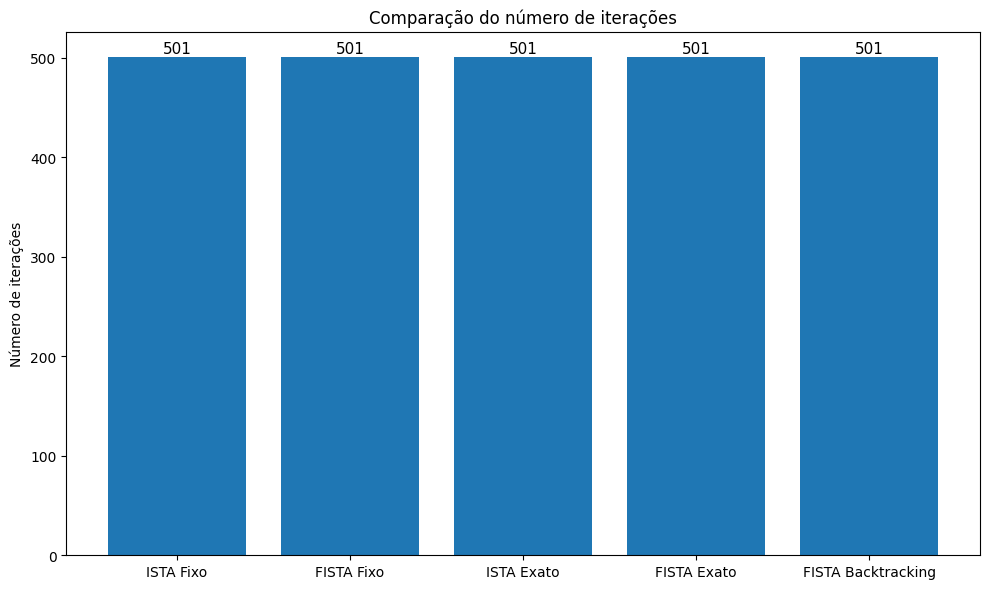

In [29]:
num_iters = [ results[ name ][ "iterations" ] for name in names ]

plt.figure( figsize = ( 10, 6 ) )
bars = plt.bar( names, num_iters )
plt.ylabel( "Número de iterações" )
plt.title( "Comparação do número de iterações" )

for bar in bars:
    height = bar.get_height()
    plt.text( bar.get_x() + bar.get_width() / 2, height + 1, str( height ), ha = 'center', va = 'bottom', fontsize = 11 )
plt.tight_layout()
plt.show()


Note que parece que para valores pequenos de $\gamma$ o algoritmo não converge para o ISTA Exato (porque?). Para valores maiores do parâmentro de regularização o algoritmo parece convergir.

Importante notar também como a qualidade da reconstrução para o valor de parâmetro de regularização $\gamma = 0.01$ é muito melhor do que para $\gamma = 0.2$.

Além disso, para o FISTA Exato, o algoritmo não parece convergir para nenhum valor de $\gamma$

# Testando para diferentes valores de $\gamma$

In [10]:
x0 = np.zeros_like( b )
prox = Algorithms.prox_tv
params_tv = {'max_iter_tv' : 15, 
              'L' : L, 
              'LT' : LT, 
              'proj_P' : Algorithms.proj_P,
              'Q' : ATA}


In [11]:
gammas = [ 0.001, 0.01, 0.1, 0.2 ]
step = 1.0
all_experiments = {}

for gm in gammas:
    print( f"gamma = {gm}:" )
    
    methods = {
        "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
            Algorithms.ista_exato( f = f, grad_f = grad_f, prox = prox, x0 = x0, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
        
        "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
            Algorithms.fista_exato( f = f, grad_f = grad_f, prox = prox, x0 = x0, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
        
        "ISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
            Algorithms.ista_fixo( f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
        
        "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
            Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
    }

    res, F_star = compare_methods(
        methods = methods, f = f, g = g, grad_f = grad_f, prox = prox, x0 = x0, 
        gamma = gm, img = img, max_iter = 250, tol = 1e-2, **params_tv
    )
    
    all_experiments[ gm ] = {"results": res, "F_star": F_star}

gamma = 0.001:
gamma = 0.01:
gamma = 0.1:
gamma = 0.2:


<>:16: SyntaxWarning: invalid escape sequence '\g'
<>:28: SyntaxWarning: invalid escape sequence '\g'
<>:16: SyntaxWarning: invalid escape sequence '\g'
<>:28: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_42406/1670168332.py:16: SyntaxWarning: invalid escape sequence '\g'
  ax_iter.set_title( f"Convergência (Iterações) - $\gamma$ = {g_val}" )
/tmp/ipykernel_42406/1670168332.py:28: SyntaxWarning: invalid escape sequence '\g'
  ax_time.set_title( f"Convergência (Tempo) - $\gamma$ = {g_val}" )


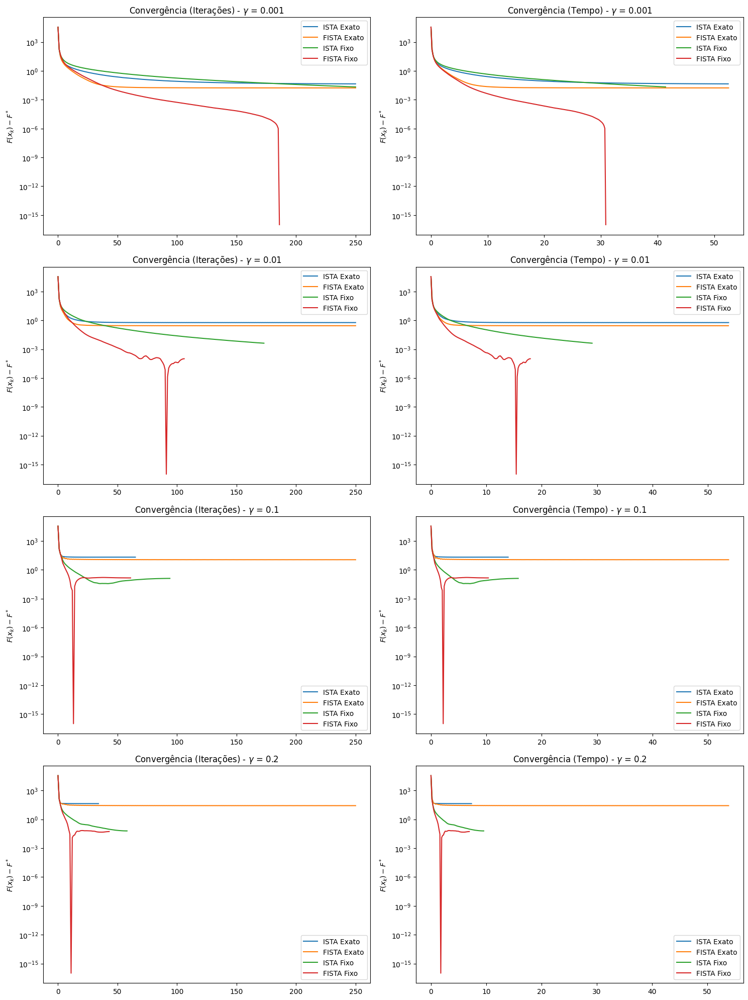

In [14]:
num_gammas = len( gammas )
fig, axes = plt.subplots( num_gammas, 2, figsize = ( 15, 5 * num_gammas ) )

epsilon = 1e-16

for i, g_val in enumerate( gammas ):
    res = all_experiments[ g_val ][ "results" ]
    F_star = all_experiments[ g_val ][ "F_star" ]
    
    ax_iter = axes[ i, 0 ]
    for name in res.keys():
        vals = res[ name ][ "F_values" ]
        diff_vals = [ max( F - F_star, epsilon ) for F in vals ]
        ax_iter.semilogy( diff_vals, label = name )
    
    ax_iter.set_title( f"Convergência (Iterações) - $\gamma$ = {g_val}" )
    ax_iter.set_ylabel( "$F(x_k) - F^*$" )
    ax_iter.legend()

    ax_time = axes[ i, 1 ]
    for name in res.keys():
        vals = np.array( res[ name ][ "F_values" ] )
        diff_vals = [ max( v - F_star, epsilon ) for v in vals ]
        total_time = res[ name ][ "execution_time" ]
        times = np.linspace( 0, total_time, len( vals ) )
        ax_time.semilogy( times, diff_vals, label = name )
    
    ax_time.set_title( f"Convergência (Tempo) - $\gamma$ = {g_val}" )
    ax_time.set_ylabel( "$F(x_k) - F^*$" )
    ax_time.legend()

plt.tight_layout()
plt.show()

<>:16: SyntaxWarning: invalid escape sequence '\g'
<>:30: SyntaxWarning: invalid escape sequence '\g'
<>:16: SyntaxWarning: invalid escape sequence '\g'
<>:30: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_42406/1463473128.py:16: SyntaxWarning: invalid escape sequence '\g'
  ax_iter.set_title( f"Estabilidade (Iterações) - $\gamma$ = {g_val}" )
/tmp/ipykernel_42406/1463473128.py:30: SyntaxWarning: invalid escape sequence '\g'
  ax_time.set_title( f"Estabilidade (Tempo) - $\gamma$ = {g_val}" )


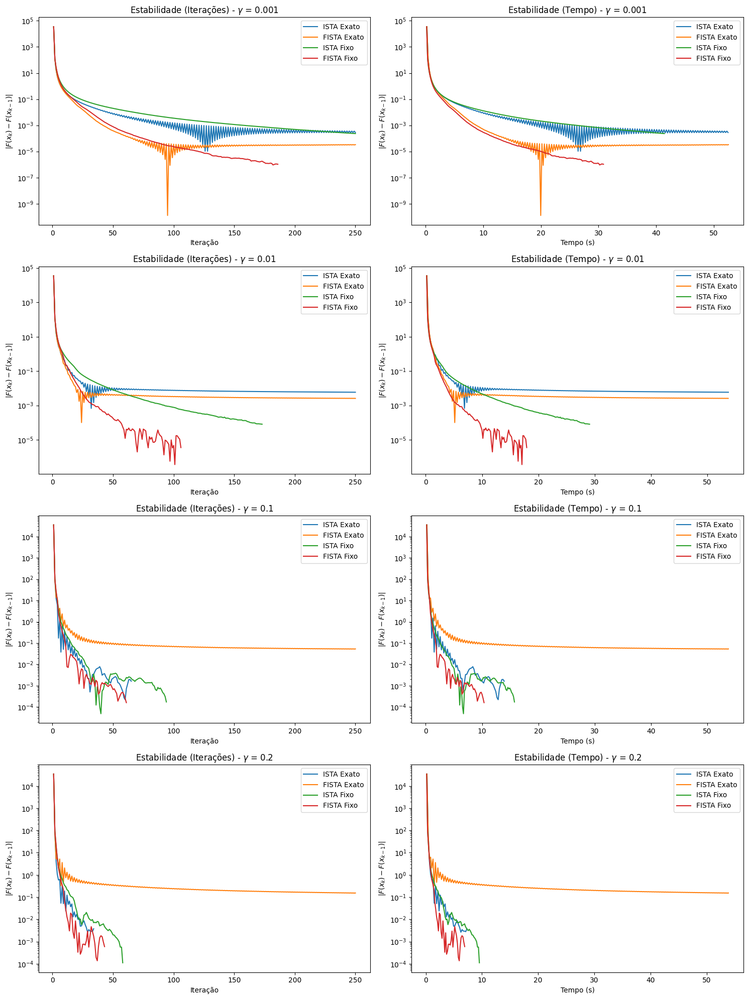

In [15]:
num_gammas = len( gammas )
fig, axes = plt.subplots( num_gammas, 2, figsize = ( 15, 5 * num_gammas ) )

epsilon = 1e-16

for i, g_val in enumerate( gammas ):
    res = all_experiments[ g_val ][ "results" ]
    
    ax_iter = axes[ i, 0 ]
    for name in res.keys():
        vals = res[ name ][ "F_values" ]
        # Calculando a diferença absoluta entre iterações consecutivas
        diff_vals = [ max( np.abs( vals[ j ] - vals[ j - 1 ] ), epsilon ) for j in range( 1, len( vals ) ) ]
        ax_iter.semilogy( range( 1, len( vals ) ), diff_vals, label = name )
    
    ax_iter.set_title( f"Estabilidade (Iterações) - $\gamma$ = {g_val}" )
    ax_iter.set_ylabel( "$|F(x_k) - F(x_{k-1})|$" )
    ax_iter.set_xlabel( "Iteração" )
    ax_iter.legend()

    ax_time = axes[ i, 1 ]
    for name in res.keys():
        vals = np.array( res[ name ][ "F_values" ] )
        diff_vals = [ max( np.abs( vals[ j ] - vals[ j - 1 ] ), epsilon ) for j in range( 1, len( vals ) ) ]
        total_time = res[ name ][ "execution_time" ]
        # O vetor de tempo precisa ter o mesmo tamanho das diferenças (n - 1)
        times = np.linspace( 0, total_time, len( vals ) )[ 1: ]
        ax_time.semilogy( times, diff_vals, label = name )
    
    ax_time.set_title( f"Estabilidade (Tempo) - $\gamma$ = {g_val}" )
    ax_time.set_ylabel( "$|F(x_k) - F(x_{k-1})|$" )
    ax_time.set_xlabel( "Tempo (s)" )
    ax_time.legend()

plt.tight_layout()
plt.show()

# Plotando os tamanhos de passo calculados ao utilizar busca exata

In [10]:
#alguns testes rapidos
def fista_exato( f, x0, Q, grad_f, prox, gamma, max_iter = 1000, tol = 1.0e-1, **kwargs  ):
    y0 = x0.copy()
    x = x0.copy()
    iterations = 0
    t0 = 1
    iters = [ x.copy() ]
    dif = float( 'inf' )
    lbds = []
    while dif > tol and iterations < max_iter:
        x0 = x.copy()
        g_y = grad_f( y0 )
        num = np.sum( g_y * g_y )  
        den = np.sum( g_y * Q( g_y ) )
        step = num / den
        # if iterations % 50 == 0:
        #     print( f'O tamanho do passo para o fista com passo exato foi de: {step}' )
        ygrad = y0 - step * g_y
    
        x = prox( ygrad, step = step, gamma = gamma, **kwargs )
        t = ( 1 + np.sqrt( 1 + 4*t0 ** 2 ) ) / 2
        y = x + ( ( t0 - 1 ) / ( t ) )  * ( x - x0 )
        
        dif = np.linalg.norm( x - x0 )


        y0 = y
        t0 = t
        iterations += 1
        iters.append( x.copy() )
        lbds.append( step )

    return iters, lbds

def ista_exato( f, x0, grad_f, prox, gamma, Q, max_iter = 1000, tol = 1.0e-1, **kwargs ):
    x = x0.copy()
    iterations = 0
    iters = [ x.copy() ]
    dif = float( 'inf' )
    lbds = []
    while dif > tol and iterations < max_iter:
        x0 = x.copy()
        g_f = grad_f( x0 )

        num = np.sum( g_f * g_f )  
        den = np.sum( g_f * Q( g_f ) )
        step = num / den
        # if iterations % 50 == 0:
        #     print( f'O tamanho do passo para o ista com passo exato foi de: {step}' )

        y = x0 - step * g_f
        x = prox( y, step = step, gamma = gamma, **kwargs )
                
        iterations += 1
        iters.append( x.copy() )
        dif = np.linalg.norm( x - x0 )
        lbds.append( step )
    return iters, lbds


In [11]:
x0 = np.zeros_like( b )
gamma = 0.001 #gamma ótimo
prox = Algorithms.prox_tv
max_iter = 250
tol = 1.0e-2

kwargs = {'max_iter_tv' : 10, 'L' : L, 'LT' : LT, 'proj_P' : Algorithms.proj_P}


iters_fista_exato, steps_fista = fista_exato( Q = ATA, f = f, grad_f = grad_f, prox = prox, x0 = x0, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
iters_ista_exato, steps_ista = ista_exato( Q = ATA, f = f, grad_f = grad_f, prox = prox, x0 = x0, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )

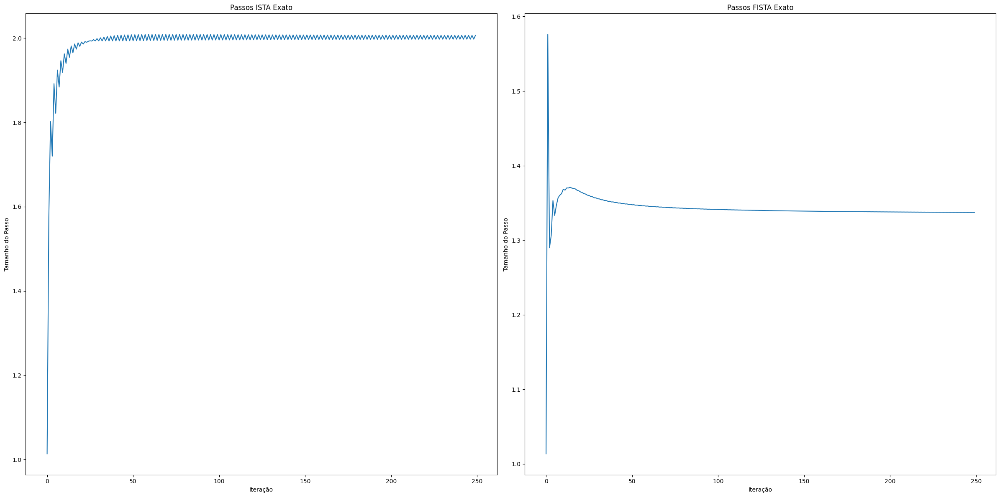

In [12]:
plt.figure( figsize = ( 24, 12 ) )
plt.subplot( 1, 2, 1 )
plt.plot( steps_ista )
plt.title( "Passos ISTA Exato" )
plt.xlabel( "Iteração" )
plt.ylabel( "Tamanho do Passo" )

plt.subplot( 1, 2, 2 )
plt.plot( steps_fista )
plt.title( "Passos FISTA Exato" )
plt.xlabel( "Iteração" )
plt.ylabel( "Tamanho do Passo" )

plt.tight_layout()
plt.show()

In [20]:
print( f'O tamanho do último passo no ISTA foi de: {steps_ista[-1]}' )
print( f'O tamanho do último passo no FISTA foi de: {steps_fista[-1]}' )

O tamanho do último passo no ISTA foi de: 2.0066114574047926
O tamanho do último passo no FISTA foi de: 1.3372417433902726


Para garantir a convergência, precisamos de:

ISTA : $\lambda < \frac{2}{L} = \frac{2}{0.9997} = 2.0006$.

FISTA : temos que $\lambda \leq \frac{1}{L} = \frac{1}{0.9997} = 1.0003$.

Veja que no caso do ISTA o tamanho de passo começar a aumentar ao longo das iterações, o que implica que a partir de um certo ponto o algoritmo passa a descumprir a garantia de convergência. No FISTA essa garantia é quebrada desde o início basicamente. Além disso o algoritmo parece ficar preso, não conseguindo atingir o mínimo (efeito zigue zague no tamanho de passo).

In [34]:
x0 = np.zeros_like( b )
gamma = 0.001 #gamma ótimo
prox = Algorithms.prox_tv
step = 1

methods = {
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Backtracking": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_backtracking( f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, beta = 0.95, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs  )
}

params_tv = {'max_iter_tv' : 10, 
              'L' : L, 
              'LT' : LT, 
              'proj_P' : Algorithms.proj_P,
              'Q' : ATA}

results, F_star = compare_methods( methods, f = f, g = g, grad_f = grad_f, prox = prox, x0 = x0, gamma = gamma, img = img, max_iter = 500, tol = 1e-2, **params_tv )

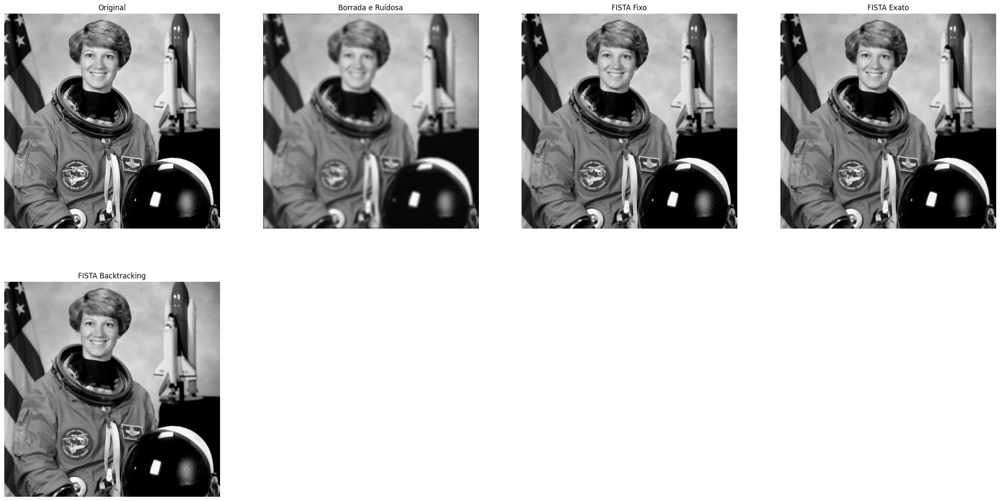

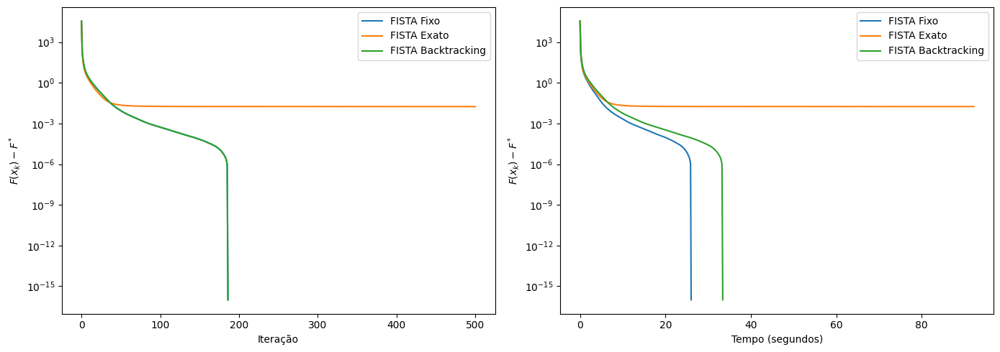

In [35]:
plt.figure( figsize = ( 30, 15 ) )

names = [ "FISTA Fixo", "FISTA Exato", "FISTA Backtracking" ]

plt.subplot( 2, 4, 1 )
plt.imshow( img, cmap = plt.cm.gray )
plt.axis( "off" )
plt.title( "Original" )

plt.subplot( 2, 4, 2 )
plt.imshow( b, cmap = plt.cm.gray )
plt.axis( "off" )
plt.title( "Borrada e Ruídosa" )

for i, name in enumerate( names, start = 3 ):
    plt.subplot( 2, 4, i )
    plt.imshow( results[ name ][ "final_image" ], cmap = plt.cm.gray )
    plt.axis( "off" )
    plt.title( name )

plt.show()
epsilon = 1e-16

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "F_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()


plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "F_values" ] )
    diff_vals = vals - F_star + epsilon
    total_time = results[ name ][ "execution_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()


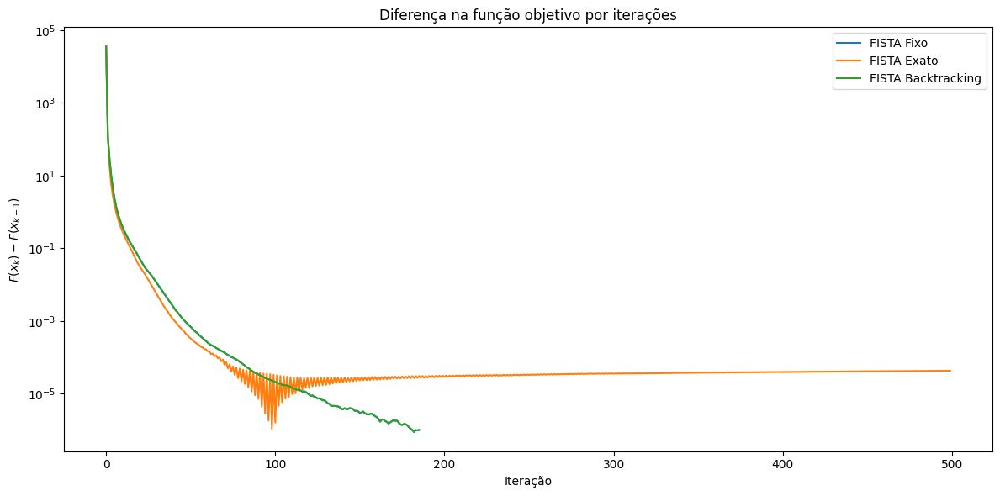

In [36]:
plt.figure( figsize = ( 12, 6 ) )
for name in names:
    deltas = delta_F( results[ name ][ "F_values" ] )
    plt.semilogy( deltas, label = name )

plt.legend()
plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F(x_{k-1})$" )
plt.title("Diferença na função objetivo por iterações")
plt.tight_layout()
plt.show()

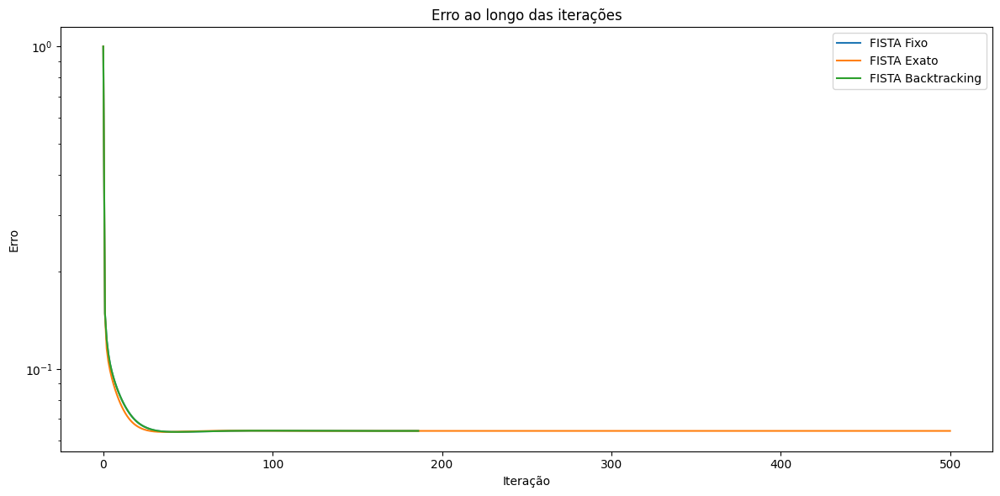

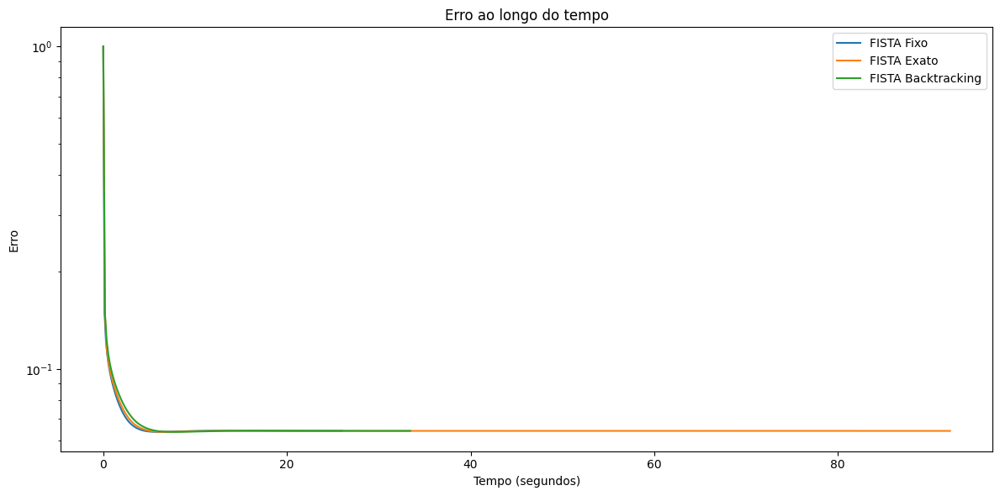

In [37]:
plt.figure( figsize = ( 12, 6 ) )

for name in names:
    vals = results[ name ][ "errors" ]
    plt.semilogy( vals, label = name )

plt.legend()
plt.xlabel( "Iteração" )
plt.ylabel( "Erro" )
plt.title( "Erro ao longo das iterações" )
plt.tight_layout()
plt.show()

plt.figure( figsize = ( 12, 6 ) )

for name in names:
    vals = np.array( results[ name ][ "errors" ] )
    total_time = results[ name ][ "execution_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    plt.semilogy( times, vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "Erro" )
plt.legend()
plt.title( "Erro ao longo do tempo" )
plt.tight_layout()
plt.show()

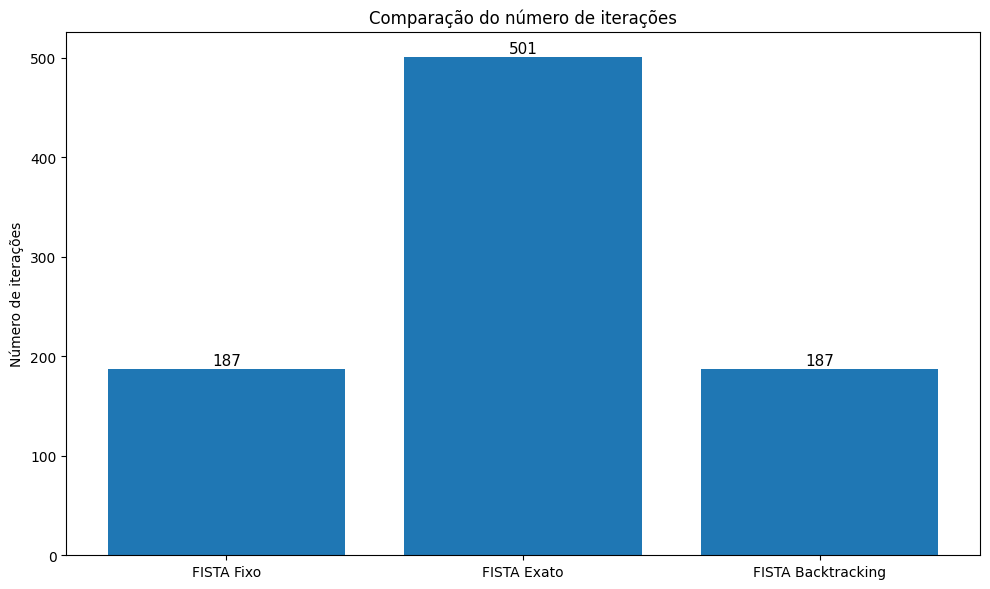

In [38]:
num_iters = [ results[ name ][ "iterations" ] for name in names ]

plt.figure( figsize = ( 10, 6 ) )
bars = plt.bar( names, num_iters )
plt.ylabel( "Número de iterações" )
plt.title( "Comparação do número de iterações" )

for bar in bars:
    height = bar.get_height()
    plt.text( bar.get_x() + bar.get_width() / 2, height + 1, str( height ), ha = 'center', va = 'bottom', fontsize = 11 )
plt.tight_layout()
plt.show()


# Comparando a qualidade das reconstruções (Wavelet e TV)

In [ ]:
x0 = np.zeros_like( b )
gamma = 0.01
step = 1
max_iter = 200
tol = 1.0e-2
prox_tv = Algorithms.prox_tv
prox_wv = Algorithms.prox_wavelet

methods_tv = {
    "FISTA Fixo TV": lambda f, grad_f, prox_tv, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox_tv, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato TV": lambda f, grad_f, prox_tv, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox_tv, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
}

methods_wv = {
    "FISTA Exato Wavelet": lambda f, grad_f, prox_wv, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato(f = f, x0 = x0, grad_f = grad_f, prox = prox_wv, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Fixo Wavelet": lambda f, grad_f, prox_wv, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox_wv, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )    
}

params_tv = {'max_iter_tv' : 10, 
              'L' : L, 
              'LT' : LT, 
              'proj_P' : Algorithms.proj_P,
              'Q' : ATA}

params_wv = { 'wavelet' : 'db5', 
              'Q' : ATA}


results_tv, F_star_tv = compare_methods( methods_tv, f, g, grad_f, prox_tv, x0, gamma, img, max_iter = max_iter, tol = tol, **params_tv )
results_wv, F_star_wv = compare_methods( methods_wv, f, g, grad_f, prox_wv, x0, gamma, img, max_iter = max_iter, tol = tol, **params_wv )

all_results = {**results_tv, **results_wv}
names = list( all_results.keys() )

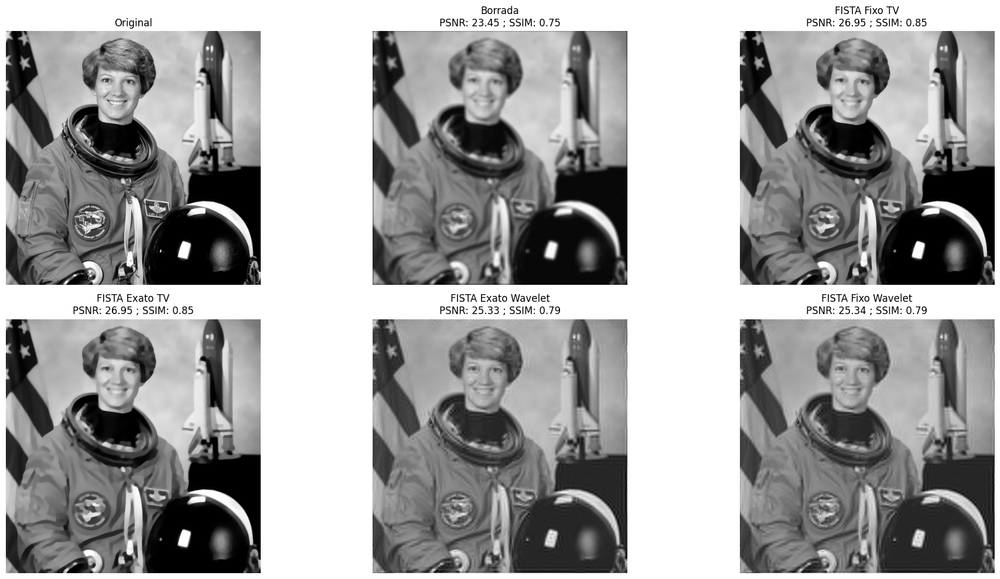

In [24]:
plt.figure( figsize = ( 20, 10 ) )

plt.subplot( 2, 3, 1 )
plt.imshow( img, cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b, s_b = get_metrics( img, b )
plt.subplot( 2, 3, 2 )
plt.imshow( b, cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f} ; SSIM: {s_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    res_img = all_results[ name ][ "final_image" ]
    p, s = get_metrics( img, res_img )
    
    plt.subplot( 2, 3, i )
    plt.imshow( res_img, cmap = 'gray' )
    plt.title( f"{name}\nPSNR: {p:.2f} ; SSIM: {s:.2f}" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

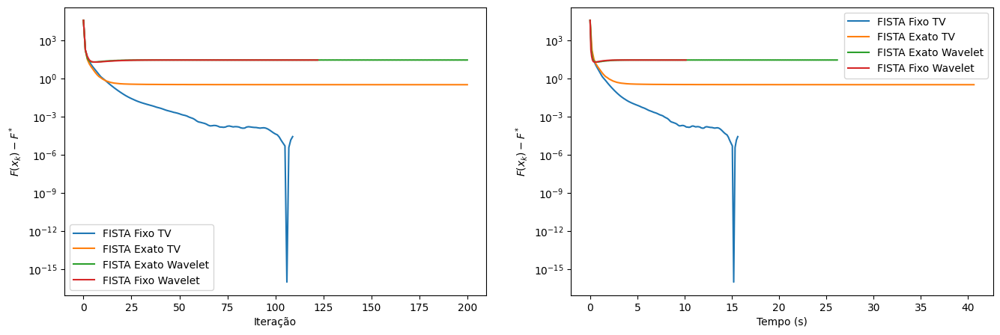

In [25]:
plt.figure( figsize = ( 16, 5 ) )
epsilon = 1e-16

plt.subplot( 1, 2, 1 )
for name in names:
    vals = all_results[ name ][ "F_values" ]
    f_min = min( [ min( all_results[ n ][ "F_values" ] ) for n in names ] )
    diff_vals = [ F - f_min + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )
plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( all_results[ name ][ "F_values" ] )
    f_min = min( [ min( all_results[ n ][ "F_values" ] ) for n in names ] )
    diff_vals = vals - f_min + epsilon
    times = np.linspace( 0, all_results[ name ][ "execution_time" ], len( vals ) )
    plt.semilogy( times, diff_vals, label = name )
plt.xlabel( "Tempo (s)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.show()

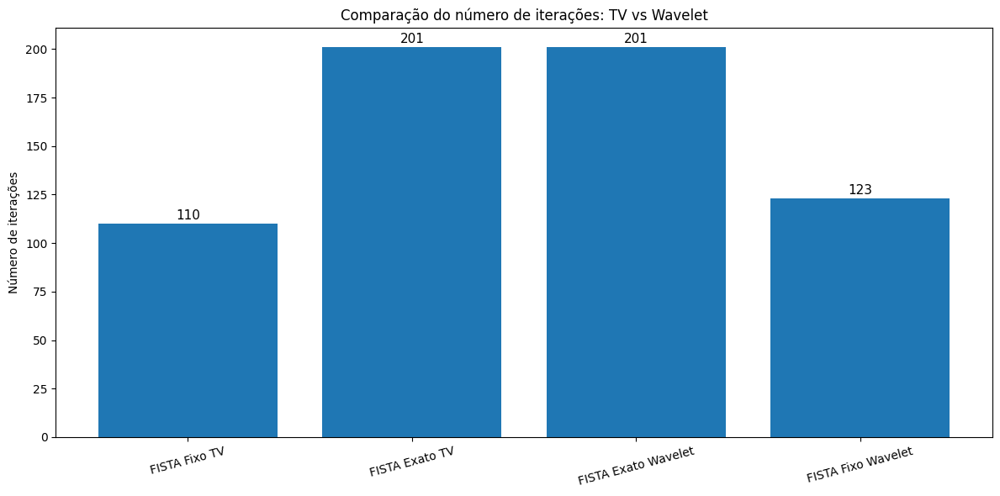

In [27]:
num_iters = [ all_results[ name ][ "iterations" ] for name in names ]

plt.figure( figsize = ( 12, 6 ) )
bars = plt.bar( names, num_iters )

plt.ylabel( "Número de iterações" )
plt.title( "Comparação do número de iterações: TV vs Wavelet" )
plt.xticks( rotation = 15 )

for bar in bars:
    height = bar.get_height()
    plt.text( bar.get_x() + bar.get_width() / 2, height + 1, str( int( height ) ), ha = 'center', va = 'bottom', fontsize = 11 )

plt.tight_layout()
plt.show()

De fato os algoritmos que usam o passo exato ficam presos. Por último realizando um teste com base somente no número de iterações.

In [28]:
results_tv, F_star_tv = compare_methods( methods_tv, f, g, grad_f, prox_tv, x0, gamma, img, max_iter = 250, tol = 1.0e-5, **params_tv )
results_wv, F_star_wv = compare_methods( methods_wv, f, g, grad_f, prox_wv, x0, gamma, img, max_iter = 250, tol = 1.0e-5, **params_wv )

all_results = {**results_tv, **results_wv}
names = list( all_results.keys() )


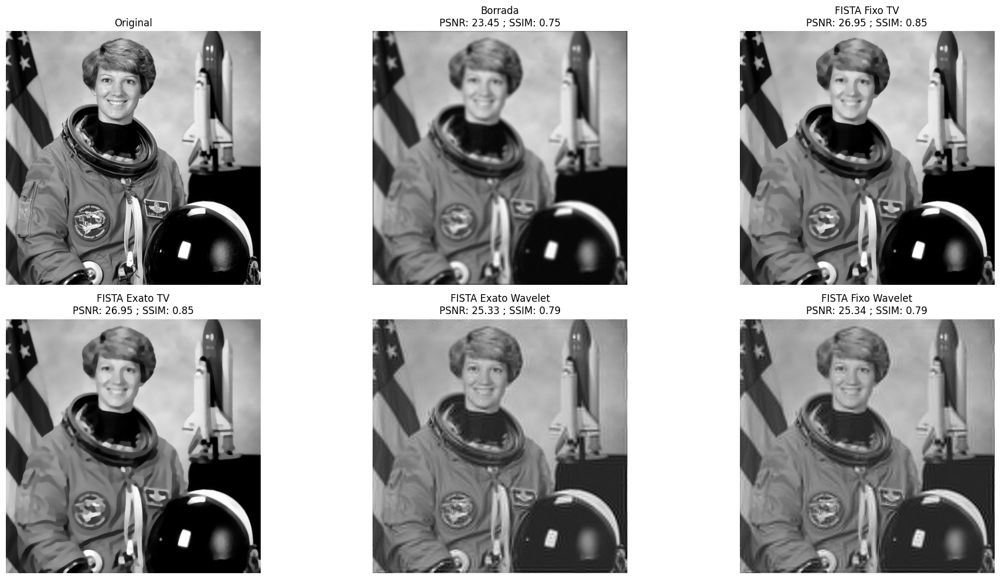

In [29]:
plt.figure( figsize = ( 20, 10 ) )

plt.subplot( 2, 3, 1 )
plt.imshow( img, cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b, s_b = get_metrics( img, b )
plt.subplot( 2, 3, 2 )
plt.imshow( b, cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f} ; SSIM: {s_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    res_img = all_results[ name ][ "final_image" ]
    p, s = get_metrics( img, res_img )
    
    plt.subplot( 2, 3, i )
    plt.imshow( res_img, cmap = 'gray' )
    plt.title( f"{name}\nPSNR: {p:.2f} ; SSIM: {s:.2f}" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

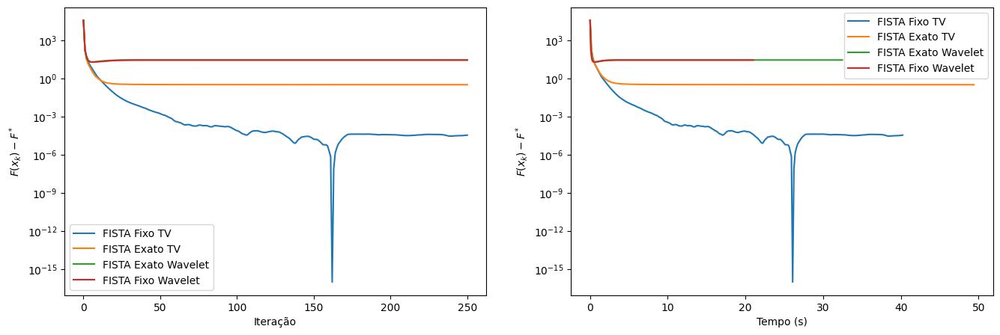

In [30]:
plt.figure( figsize = ( 16, 5 ) )
epsilon = 1e-16

plt.subplot( 1, 2, 1 )
for name in names:
    vals = all_results[ name ][ "F_values" ]
    f_min = min( [ min( all_results[ n ][ "F_values" ] ) for n in names ] )
    diff_vals = [ F - f_min + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )
plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( all_results[ name ][ "F_values" ] )
    f_min = min( [ min( all_results[ n ][ "F_values" ] ) for n in names ] )
    diff_vals = vals - f_min + epsilon
    times = np.linspace( 0, all_results[ name ][ "execution_time" ], len( vals ) )
    plt.semilogy( times, diff_vals, label = name )
plt.xlabel( "Tempo (s)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.show()

In [12]:
x0 = np.zeros_like( b )
gamma = 0.001
step = 1
max_iter = 250
tol = 1.0e-2
prox_tv = Algorithms.prox_tv
prox_wv = Algorithms.prox_wavelet

results_tv, F_star_tv = compare_methods( methods_tv, f, g, grad_f, prox_tv, x0, gamma, img, max_iter = max_iter, tol = tol, **params_tv )
results_wv, F_star_wv = compare_methods( methods_wv, f, g, grad_f, prox_wv, x0, gamma, img, max_iter = max_iter, tol = tol, **params_wv )

all_results = {**results_tv, **results_wv}
names = list( all_results.keys() )


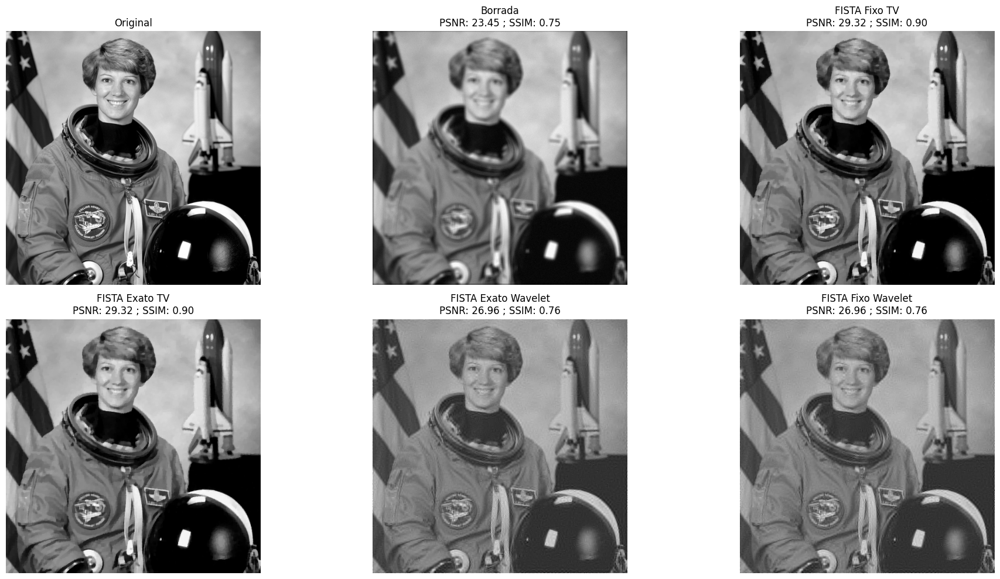

In [13]:
plt.figure( figsize = ( 20, 10 ) )

plt.subplot( 2, 3, 1 )
plt.imshow( img, cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b, s_b = get_metrics( img, b )
plt.subplot( 2, 3, 2 )
plt.imshow( b, cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f} ; SSIM: {s_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    res_img = all_results[ name ][ "final_image" ]
    p, s = get_metrics( img, res_img )
    
    plt.subplot( 2, 3, i )
    plt.imshow( res_img, cmap = 'gray' )
    plt.title( f"{name}\nPSNR: {p:.2f} ; SSIM: {s:.2f}" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

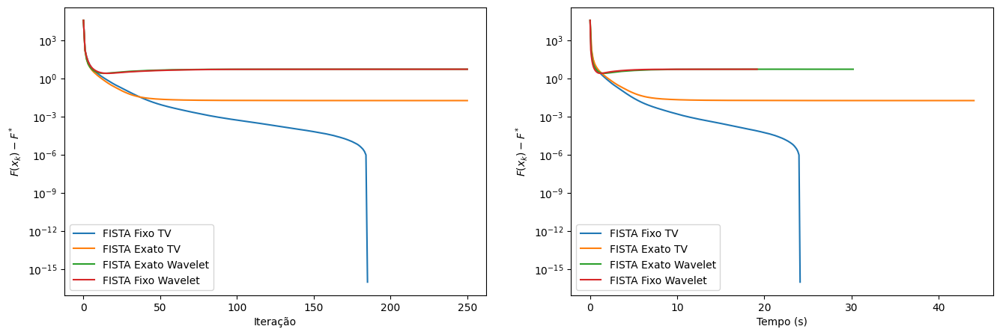

In [14]:
plt.figure( figsize = ( 16, 5 ) )
epsilon = 1e-16

plt.subplot( 1, 2, 1 )
for name in names:
    vals = all_results[ name ][ "F_values" ]
    f_min = min( [ min( all_results[ n ][ "F_values" ] ) for n in names ] )
    diff_vals = [ F - f_min + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )
plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( all_results[ name ][ "F_values" ] )
    f_min = min( [ min( all_results[ n ][ "F_values" ] ) for n in names ] )
    diff_vals = vals - f_min + epsilon
    times = np.linspace( 0, all_results[ name ][ "execution_time" ], len( vals ) )
    plt.semilogy( times, diff_vals, label = name )
plt.xlabel( "Tempo (s)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.show()

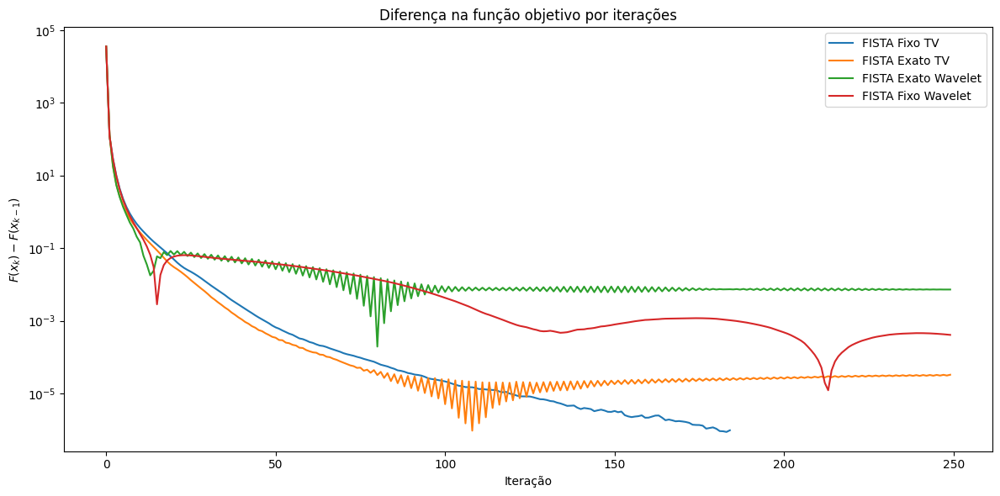

In [16]:
plt.figure( figsize = ( 12, 6 ) )
for name in names:
    deltas = delta_F( all_results[ name ][ "F_values" ] )
    plt.semilogy( deltas, label = name )

plt.legend()
plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F(x_{k-1})$" )
plt.title("Diferença na função objetivo por iterações")
plt.tight_layout()
plt.show()

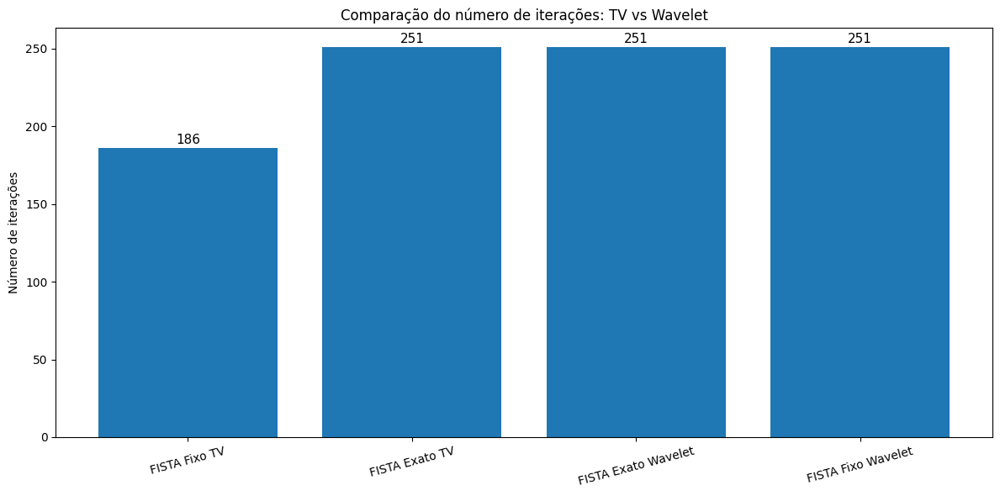

In [35]:
num_iters = [ all_results[ name ][ "iterations" ] for name in names ]

plt.figure( figsize = ( 12, 6 ) )
bars = plt.bar( names, num_iters )

plt.ylabel( "Número de iterações" )
plt.title( "Comparação do número de iterações: TV vs Wavelet" )
plt.xticks( rotation = 15 )

for bar in bars:
    height = bar.get_height()
    plt.text( bar.get_x() + bar.get_width() / 2, height + 1, str( int( height ) ), ha = 'center', va = 'bottom', fontsize = 11 )

plt.tight_layout()
plt.show()